## Technology Focus - Vizgen MERSCOPE

To follow along with this tutorial, you can download via:

```bash
gsutil -m cp -r \
  "gs://vz-merfish2-showcase/202409242358_240916JHHUBC0005XQ-V2V-HubcTMA-V2-BY_VMSC02511/region_R1" \
  .
```

#### Read data into SpatialData format

In [11]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
import copy
from pathlib import Path

import anndata as ad
import matplotlib.pyplot as plt
import pandas as pd
import scanpy as sc
import seaborn as sns
import spatialdata_io

import segtraq

/home/lazic/.venvs/segtraq_uv/lib/python3.12/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/home/lazic/.venvs/segtraq_uv/lib/python3.12/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution
/home/lazic/.venvs/segtraq_uv/lib/python3.12/site-packages/squidpy/gr/_utils.py:23: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  CAN_USE_SPARSE_ARRAY = Version(anndata.__version__) >=

In [3]:
data_path = Path("/g/huber/projects/CODEX/segtraq/data/breast/Merscope/region_R1")

sdata_merscope = spatialdata_io.merscope(data_path)

INFO     The column "global_x" has now been renamed to "x"; the column "x" was already present in the dataframe,   
         and will be dropped.                                                                                      
INFO     The column "global_y" has now been renamed to "y"; the column "y" was already present in the dataframe,   
         and will be dropped.                                                                                      


/home/lazic/.local/share/uv/python/cpython-3.12.11-linux-x86_64-gnu/lib/python3.12/functools.py:949: UserWarning: The index of the dataframe is not monotonic increasing. It is recommended to sort the data to adjust the order of the index before calling .parse() (or call `parse(sort=True)`) to avoid possible problems due to unknown divisions.
  return method.__get__(obj, cls)(*args, **kwargs)
/home/lazic/.venvs/segtraq_uv/lib/python3.12/site-packages/legacy_api_wrap/__init__.py:88: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  return fn(*args_all, **kw)


Since MERSCOPE does not provide nucleus segmentation masks, we first run cellpose segmentation on the DAPI image and add the nucleus shapes to the SpatialData object via `add_nuc_shapes_via_cellpose`.

In [4]:
segtraq.add_nuc_shapes_via_cellpose(
    sdata_merscope,
    channels="DAPI",
    images_data_key="scale4/image",
    shapes_key="Merscope_region_R1_polygons",
    images_key="Merscope_region_R1_z3",
)

channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


In [5]:
sdata_merscope

SpatialData object
├── Images
│     └── 'Merscope_region_R1_z3': DataTree[cyx] (5, 42962, 39272), (5, 21481, 19636), (5, 10740, 9818), (5, 5370, 4909), (5, 2685, 2454)
├── Points
│     └── 'Merscope_region_R1_transcripts': DataFrame with shape: (<Delayed>, 10) (3D points)
├── Shapes
│     ├── 'Merscope_region_R1_polygons': GeoDataFrame shape: (92461, 9) (2D shapes)
│     └── 'nucleus_boundaries': GeoDataFrame shape: (29532, 1) (2D shapes)
└── Tables
      └── 'table': AnnData (92461, 815)
with coordinate systems:
    ▸ 'global', with elements:
        Merscope_region_R1_z3 (Images), Merscope_region_R1_transcripts (Points), Merscope_region_R1_polygons (Shapes), nucleus_boundaries (Shapes)

The plot below shows the overlay of the nucleus and cell masks. For improved cellpose performance, a higher resolution (`scale3` or lower) can be used but this will drastically increase memory usage of cellpose.

INFO     Using 'datashader' backend with 'None' as reduction method to speed up plotting. Depending on the         
         reduction method, the value range of the plot might change. Set method to 'matplotlib' to disable this    
         behaviour.                                                                                                
INFO     Using 'datashader' backend with 'None' as reduction method to speed up plotting. Depending on the         
         reduction method, the value range of the plot might change. Set method to 'matplotlib' to disable this    
         behaviour.                                                                                                


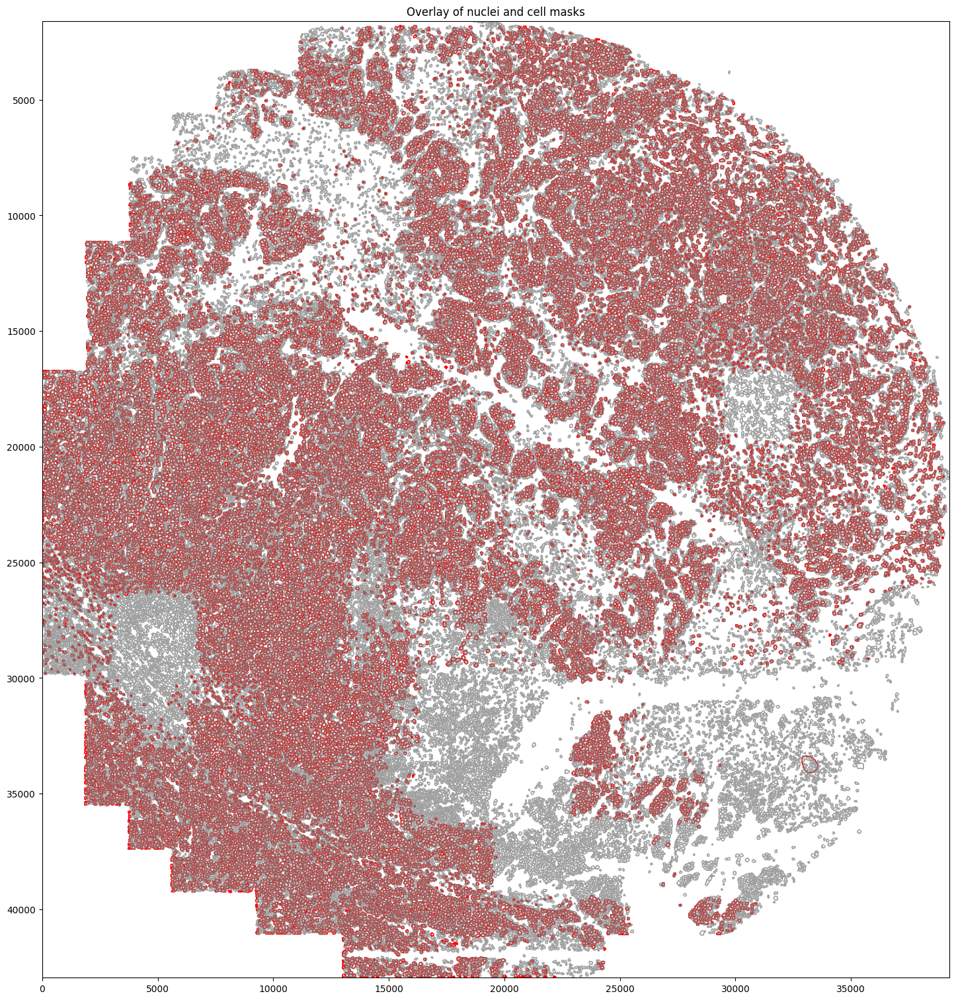

In [38]:
axes = plt.subplots(1, 1, figsize=(15, 15), constrained_layout=True)[1]

sdata_merscope.pl.render_shapes(
    element="nucleus_boundaries",
    fill_alpha=0,
    outline_alpha=1.0,
    outline_width=0.5,
    outline_color="red",
).pl.render_shapes(
    element="Merscope_region_R1_polygons",
    fill_alpha=0.0,
    outline_alpha=0.8,
    outline_width=0.5,
    outline_color="grey",
).pl.show(ax=axes, title="Overlay of nuclei and cell masks", colorbar=True)

### Initialize SegTraQ objects

Next, we initialize SegTraQ objects, the core interface for computing SegTraQ metrics. During initialization, all inputs are are validated via `validate_spatialdata()`. 

MERSCOPE layers are inconsistent: the cell ID (`EntityID` or `cell_id`) may appear both as an index and as a column, and its dtype may be either `str` or `int64` depending on the layer. See below:

In [7]:
sdata_merscope["Merscope_region_R1_transcripts"]["cell_id"].dtype

dtype('int64')

In [8]:
sdata_merscope["Merscope_region_R1_polygons"]["EntityID"].dtype

dtype('int64')

In [3]:
sdata_merscope["Merscope_region_R1_polygons"].index.values

array(['3717117300001100007', '3717117300001100008',
       '3717117300001100009', ..., '3717117300078200246',
       '3717117300078200249', '3717117300078200263'],
      shape=(92461,), dtype=object)

In [4]:
sdata_merscope["Merscope_region_R1_polygons"].index.name

'EntityID'

In [10]:
sdata_merscope["table"].obs.index.values

array(['3717117300001100007', '3717117300001100008',
       '3717117300001100009', ..., '3717117300078200246',
       '3717117300078200249', '3717117300078200263'],
      shape=(92461,), dtype=object)

In [11]:
sdata_merscope["table"].obs["EntityID"].values

array(['3717117300001100007', '3717117300001100008',
       '3717117300001100009', ..., '3717117300078200246',
       '3717117300078200249', '3717117300078200263'],
      shape=(92461,), dtype=object)

This leads to an error when initializing SegTraQ. 

In [ ]:
st_merscope = segtraq.SegTraQ(
    sdata_merscope,
    images_key="Merscope_region_R1_z3",
    tables_cell_id_key="EntityID",
    tables_area_volume_key="volume",
    points_key="Merscope_region_R1_transcripts",
    points_cell_id_key="cell_id",
    points_background_id=-1,
    points_gene_key="gene",
    shapes_key="Merscope_region_R1_polygons",
    shapes_cell_id_key=None,
    nucleus_shapes_key=None,
    nucleus_shapes_cell_id_key=None,
)

AssertionError: Missing 92461 cell IDs from polygons: [3717117300022100486, 3717117300022100487, 3717117300022100490, 3717117300022100498, 3717117300022100499]... These cell IDs are present in the points, but not in the shapes. If your missing cell ID is indicating an unassigned transcript, you can set the points_background_id parameter.

Cell IDs are of datatype `str` in points and `int64` in shapes. We will convert the cell IDs in points to `str`.

In [6]:
sdata_merscope["Merscope_region_R1_transcripts"]["cell_id"] = sdata_merscope["Merscope_region_R1_transcripts"][
    "cell_id"
].astype("str")

Now we can try to initialize the SegTraQ object again. We also have to change the `points_background_id` to `str`.

In [7]:
st_merscope = segtraq.SegTraQ(
    sdata_merscope,
    images_key="Merscope_region_R1_z3",
    tables_cell_id_key="EntityID",
    tables_area_volume_key="volume",
    points_key="Merscope_region_R1_transcripts",
    points_cell_id_key="cell_id",
    points_background_id="-1",
    points_gene_key="gene",
    shapes_key="Merscope_region_R1_polygons",
    shapes_cell_id_key=None,
    nucleus_shapes_cell_id_key=None,
)

### Visualize spatialdata

We then use `spatialdata_plot` to visualize the segmentation masks of two methods.

*Vizgen MERSCOPE Segmentation*

In [9]:
sdata_merscope

SpatialData object
├── Images
│     └── 'Merscope_region_R1_z3': DataTree[cyx] (5, 42962, 39272), (5, 21481, 19636), (5, 10740, 9818), (5, 5370, 4909), (5, 2685, 2454)
├── Points
│     └── 'Merscope_region_R1_transcripts': DataFrame with shape: (<Delayed>, 10) (3D points)
├── Shapes
│     ├── 'Merscope_region_R1_polygons': GeoDataFrame shape: (92461, 9) (2D shapes)
│     └── 'nucleus_boundaries': GeoDataFrame shape: (29516, 1) (2D shapes)
└── Tables
      └── 'table': AnnData (92461, 815)
with coordinate systems:
    ▸ 'global', with elements:
        Merscope_region_R1_z3 (Images), Merscope_region_R1_transcripts (Points), Merscope_region_R1_polygons (Shapes), nucleus_boundaries (Shapes)

INFO     Using 'datashader' backend with 'None' as reduction method to speed up plotting. Depending on the         
         reduction method, the value range of the plot might change. Set method to 'matplotlib' to disable this    
         behaviour.                                                                                                
INFO     Using the datashader reduction "mean". "max" will give an output very close to the matplotlib result.     


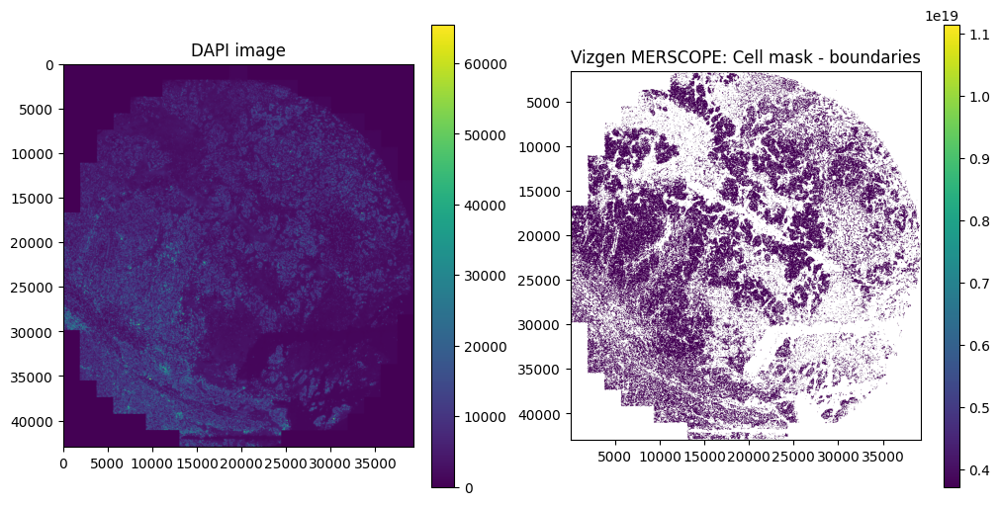

In [ ]:
axes = plt.subplots(1, 2, figsize=(10, 5), constrained_layout=True)[1].flatten()

# Dapi image
sdata_merscope.pl.render_images("Merscope_region_R1_z3", channel="DAPI", scale="scale4").pl.show(
    ax=axes[0], title="DAPI image", coordinate_systems="global"
)

# Plot - Cell boundaries
sdata_merscope.tables["table"].obs["region"] = "Merscope_region_R1_polygons"
sdata_merscope.set_table_annotates_spatialelement("table", region="Merscope_region_R1_polygons")

sdata_merscope.pl.render_shapes("Merscope_region_R1_polygons", color="EntityID").pl.show(
    ax=axes[1], title="Vizgen MERSCOPE: Cell mask - boundaries", coordinate_systems="global"
)

### Running SegTraQ QC metrics

#### Baseline metrics

The baseline `bl` module allows the computation of baseline metrics such as the number of cells and the % of unassigned transcripts.

In [8]:
st_dict = {"merscope": st_merscope}

In [ ]:
for method, st in st_dict.items():
    num_cells = st.bl.num_cells()
    p_unassigned = st.bl.perc_unassigned_transcripts()
    print(f"{method}: #cells: {num_cells} %unassigned: {p_unassigned}")

merscope: #cells: 92461 %unassigned: 0.2261879966430826


The baseline module also facilitates the computation of morphological features.

In [17]:
for _method, st in st_dict.items():
    st.bl.morphological_features(n_jobs=8)

Within computation of morphological features, the index of the `obs` is dropped - not sure why

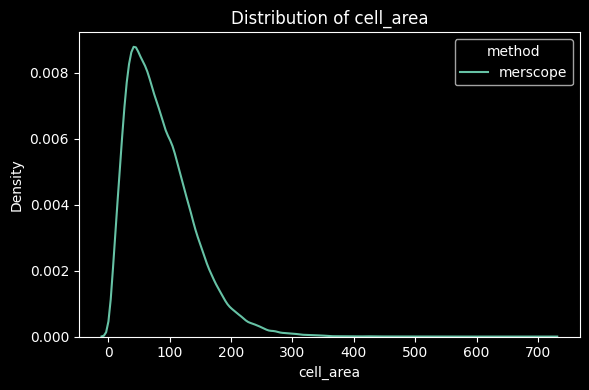

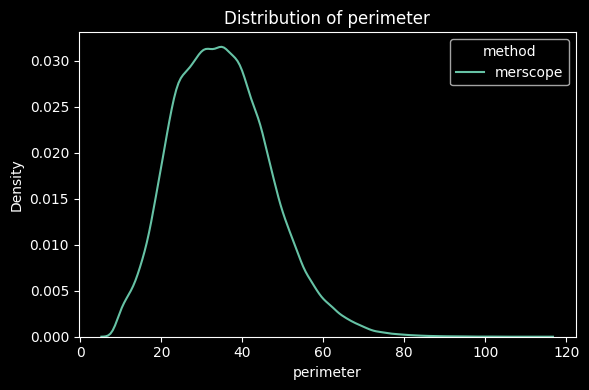

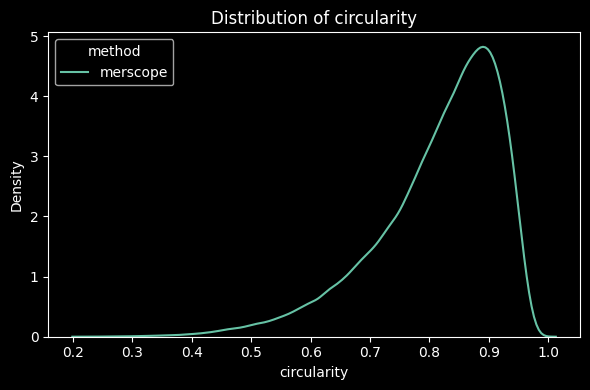

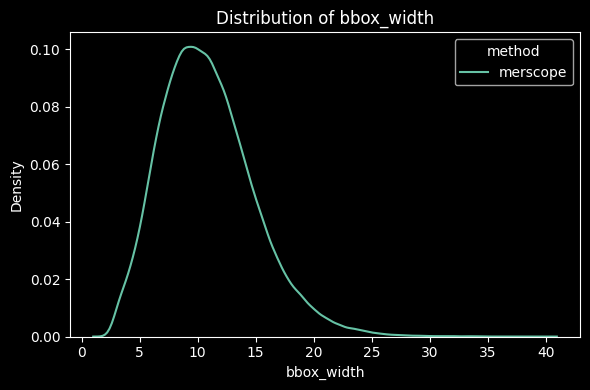

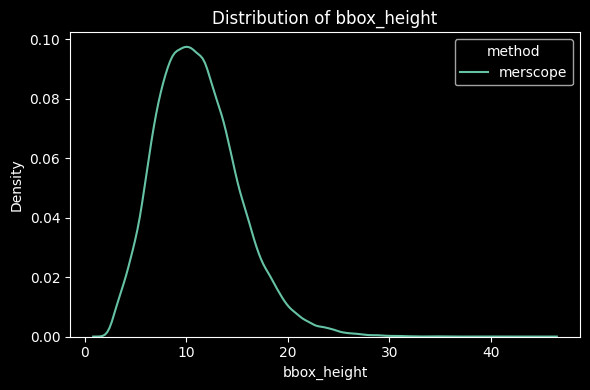

...

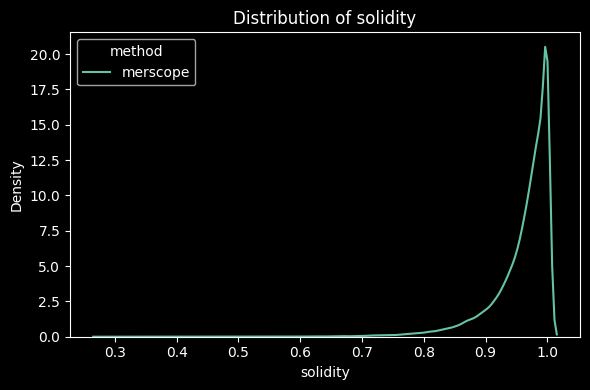

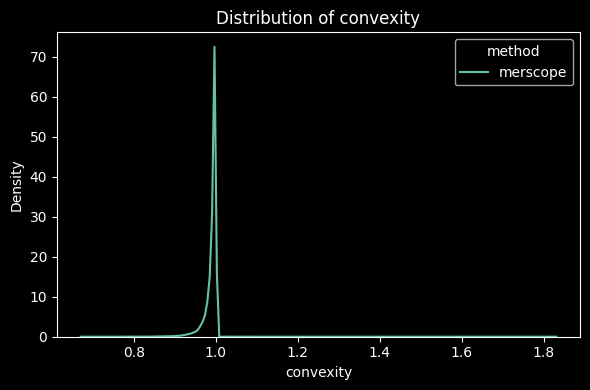

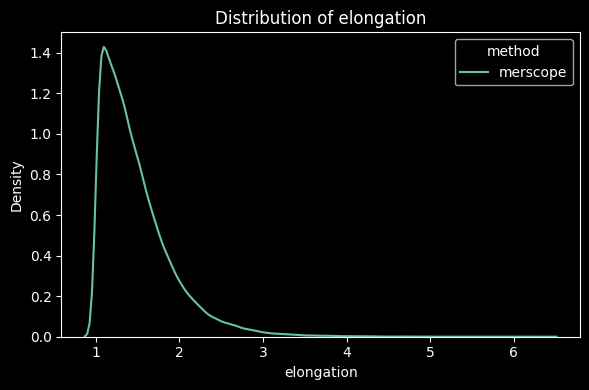

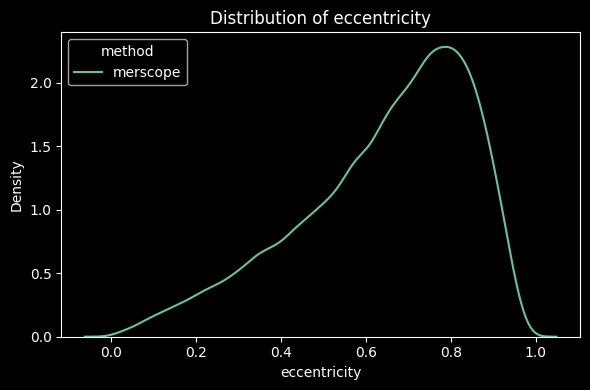

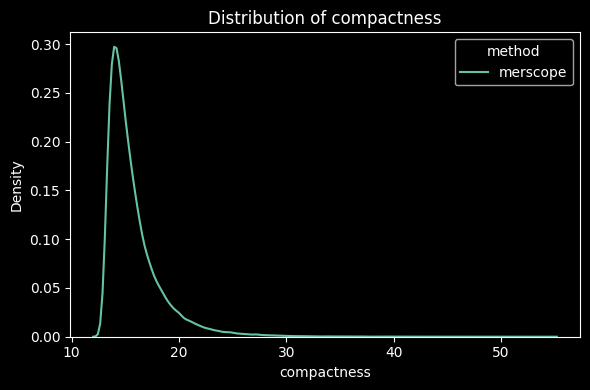

In [ ]:
plt.style.use("dark_background")

features = [
    "cell_area",
    "perimeter",
    "circularity",
    "bbox_width",
    "bbox_height",
    "extent",
    "solidity",
    "convexity",
    "elongation",
    "eccentricity",
    "compactness",
]

# Collect features into one dataframe
all_feats = []
for method, st in st_dict.items():
    feat = st.sdata["table"].obs[features]
    tmp = feat.copy()
    tmp["method"] = method
    all_feats.append(tmp)

df = pd.concat(all_feats, ignore_index=True)
df["method"] = df["method"].astype(str)

feature_cols = [c for c in df.columns if c != "method"]

# Apply dark background globally
plt.style.use("dark_background")

for feat_name in feature_cols:
    fig, ax = plt.subplots(figsize=(6, 4), facecolor="black")
    ax.set_facecolor("black")

    sns.kdeplot(data=df, x=feat_name, hue="method", palette="Set2", common_norm=False, fill=False, ax=ax)

    # White text for readability
    ax.set_title(f"Distribution of {feat_name}")
    ax.set_xlabel(feat_name)
    ax.set_ylabel("Density")

    fig.tight_layout()
    plt.show()

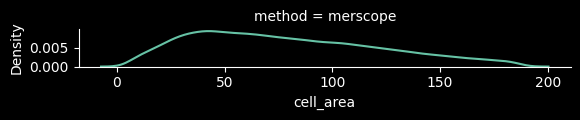

In [ ]:
methods = df["method"].unique()
palette = dict(zip(methods, sns.color_palette("Set2", len(methods)), strict=False))

g = sns.displot(
    data=df[df["cell_area"] <= df["cell_area"].quantile(0.95)],
    x="cell_area",
    hue="method",
    row="method",
    kind="kde",
    common_norm=False,
    fill=False,
    facet_kws={"sharey": False},
    palette=palette,
    height=1.3,
    aspect=4.6,
)
g._legend.remove()

#### Clustering stability metrics
The clustering stability (`cs`) module provides metrics for assessing the stability of clustering results across different resolutions and random subsets of genes.

Let`s first perform Leiden clustering and visualize these in the UMAP space.

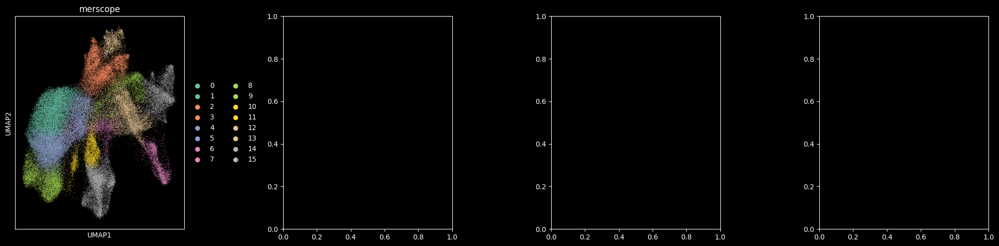

In [ ]:
fig, axs = plt.subplots(1, 4, figsize=(20, 5))

axs = axs.flatten()

for i, (method, st) in enumerate(st_dict.items()):
    adata = st.sdata.tables["table"]
    adata.layers["counts"] = adata.X.copy()
    sc.pp.normalize_total(adata, inplace=True)
    sc.pp.log1p(adata)
    sc.pp.pca(adata)
    sc.pp.neighbors(adata)
    sc.tl.umap(adata)
    sc.tl.leiden(adata, flavor="igraph", n_iterations=2)

    sc.pl.umap(
        adata,
        color="leiden",
        palette="Set2",
        ax=axs[i],
        show=False,
        title=method,
    )

plt.tight_layout()
plt.show()

Next, we compute clustering stability metrics and plot these.

In [ ]:
mcds = {}
silhouette_scores = {}
purities = {}
aris = {}

for method, st in st_dict.items():
    mcds[method] = st.cs.compute_mean_cosine_distance()
    silhouette_scores[method] = st.cs.compute_silhouette_score()
    purities[method] = st.cs.compute_purity()
    aris[method] = st.cs.compute_ari()

In [ ]:
results_df = pd.DataFrame(
    {
        "Method": list(mcds.keys()),
        "MCD": list(mcds.values()),
        "Silhouette Score": list(silhouette_scores.values()),
        "Purity": list(purities.values()),
        "ARI": list(aris.values()),
    }
)

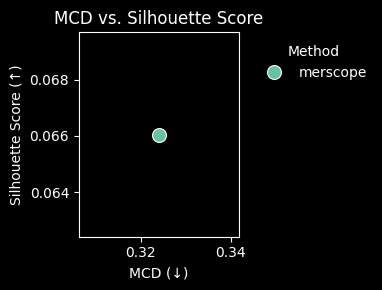

In [ ]:
fig, ax = plt.subplots(figsize=(4, 3), facecolor="black")
ax.set_facecolor("black")

sns.scatterplot(
    data=results_df,
    x="MCD",
    y="Silhouette Score",
    hue="Method",
    style="Method",
    s=100,
    palette="Set2",
    ax=ax,
)

ax.set_xlabel("MCD (↓)", color="white")
ax.set_ylabel("Silhouette Score (↑)", color="white")
ax.set_title("MCD vs. Silhouette Score", color="white")
ax.tick_params(colors="white")

# Legend styling
legend = ax.legend(title="Method", frameon=False, bbox_to_anchor=(1.05, 1), loc="upper left")
plt.setp(legend.get_texts(), color="white")
plt.setp(legend.get_title(), color="white")

fig.tight_layout()
plt.show()

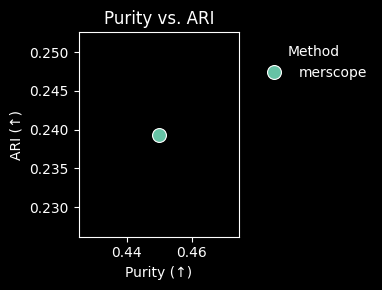

In [47]:
# Dark style
plt.style.use("dark_background")

fig, ax = plt.subplots(figsize=(4, 3), facecolor="black")
ax.set_facecolor("black")

sns.scatterplot(
    data=results_df,
    x="Purity",
    y="ARI",
    hue="Method",
    style="Method",
    s=100,
    palette="Set2",  # consistent palette
    ax=ax,
)

ax.set_xlabel("Purity (↑)", color="white")
ax.set_ylabel("ARI (↑)", color="white")
ax.set_title("Purity vs. ARI", color="white")
ax.tick_params(colors="white")

# Legend styling
legend = ax.legend(title="Method", frameon=False, bbox_to_anchor=(1.05, 1), loc="upper left")
plt.setp(legend.get_texts(), color="white")
plt.setp(legend.get_title(), color="white")

fig.tight_layout()
plt.show()

#### Nuclear correlation metrics

The nuclear correlation module provides metrics to evaluate the correlation between the cell and nuclear segmentation mask.
- IoU between each cell and its best-matching nucleus
- Correlation between per-cell expression and its matched nucleus (Pearson)
- Correlation between the cell's nucleus-overlap part vs. remainder (vectorized)

In [18]:
sdata_merscope["table"].obs.head()

,fov,volume,center_x,center_y,min_x,min_y,max_x,max_y,anisotropy,transcript_count,...,circularity,bbox_width,bbox_height,extent,solidity,convexity,elongation,eccentricity,compactness,num_polygons
EntityID,,,,,,,,,,,,,,,,,,,,,
3717117300001100007,1071,2462.772516,6566.667037,5394.554658,6557.159742,5385.867258,6574.868611,5406.920029,1.287218,300,...,0.687280,17.708869,21.052771,0.629122,0.893459,0.978794,1.287218,0.629662,18.284197,1
3717117300001100008,1071,1826.460734,6578.889441,5393.847266,6572.059907,5385.867258,6585.668344,5402.743508,1.467355,497,...,0.867916,13.608437,16.876250,0.757420,0.981762,0.985233,1.353922,0.674149,14.478788,1
3717117300001100009,1071,3645.594786,6586.207324,5402.879811,6573.849933,5386.359997,6597.976285,5414.478710,1.546541,1993,...,0.599508,24.126353,28.118713,0.511790,0.803646,0.931085,1.546541,0.762826,20.961154,1
3717117300001100010,1071,1622.054511,6598.987786,5391.705837,6591.040279,5385.867258,6606.627449,5398.689799,1.225551,65,...,0.914293,15.587170,12.822541,0.772920,1.000000,1.000000,1.158132,0.504419,13.744353,1
3717117300001100013,1071,758.045004,6528.638887,5396.386095,6524.031520,5389.408084,6533.277651,5401.723601,1.693373,151,...,0.746972,9.246131,12.315517,0.634005,0.934036,0.980869,1.513870,0.750774,16.823084,1


We will subset the transcripts to be able to test the NC module, since `compute_correlation_between_parts` hangs when running it on the entire MERSCOPE dataset. Explore this later.

In [8]:
sdata_merscope["Merscope_region_R1_transcripts"].compute().shape

(59985986, 10)

In [9]:
pts = sdata_merscope.points["Merscope_region_R1_transcripts"]
pts_sub = pts.sample(frac=0.01, random_state=42)
sdata_merscope.points["Merscope_region_R1_transcripts"] = pts_sub

In [18]:
len(sdata_merscope.points["Merscope_region_R1_transcripts"])

599860

In [12]:
for _method, st in st_dict.items():
    st.nc.compute_cell_nuc_ious(n_jobs=-1)
    st.nc.compute_correlation_between_parts(n_jobs=-1)
    print("Corrleation between parts done.")
    st.nc.compute_cell_nuc_correlation(n_jobs_iou=-1)

Processing IoU between cells and nuclei: 100%|██████████| 92461/92461 [01:06<00:00, 1397.04it/s]


Corrleation between parts done.


In [13]:
sdata_merscope["table"].obs.head()

,fov,volume,center_x,center_y,min_x,min_y,max_x,max_y,anisotropy,transcript_count,...,Cellbound1_high_pass,region,slide,dataset_id,cells_region,EntityID,correlation_parts,best_nuc_id,IoU,corr_nc_cell
EntityID,,,,,,,,,,,,,,,,,,,,,
3717117300001100007,1071,2462.772516,6566.667037,5394.554658,6557.159742,5385.867258,6574.868611,5406.920029,1.287218,300,...,9.565337e+06,region_R1,Merscope,Merscope_region_R1,Merscope_region_R1_polygons,3717117300001100007,NaN,564.0,0.066098,0.640089
3717117300001100008,1071,1826.460734,6578.889441,5393.847266,6572.059907,5385.867258,6585.668344,5402.743508,1.467355,497,...,6.875220e+06,region_R1,Merscope,Merscope_region_R1,Merscope_region_R1_polygons,3717117300001100008,0.332058,564.0,0.625117,0.830722
3717117300001100009,1071,3645.594786,6586.207324,5402.879811,6573.849933,5386.359997,6597.976285,5414.478710,1.546541,1993,...,9.799579e+06,region_R1,Merscope,Merscope_region_R1,Merscope_region_R1_polygons,3717117300001100009,0.355738,625.0,0.146593,0.445833
3717117300001100010,1071,1622.054511,6598.987786,5391.705837,6591.040279,5385.867258,6606.627449,5398.689799,1.225551,65,...,8.136945e+06,region_R1,Merscope,Merscope_region_R1,Merscope_region_R1_polygons,3717117300001100010,NaN,565.0,0.521084,NaN
3717117300001100013,1071,758.045004,6528.638887,5396.386095,6524.031520,5389.408084,6533.277651,5401.723601,1.693373,151,...,2.264338e+06,region_R1,Merscope,Merscope_region_R1,Merscope_region_R1_polygons,3717117300001100013,NaN,NaN,0.000000,0.000000


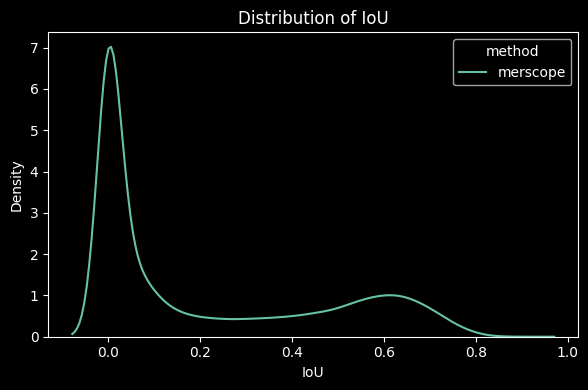

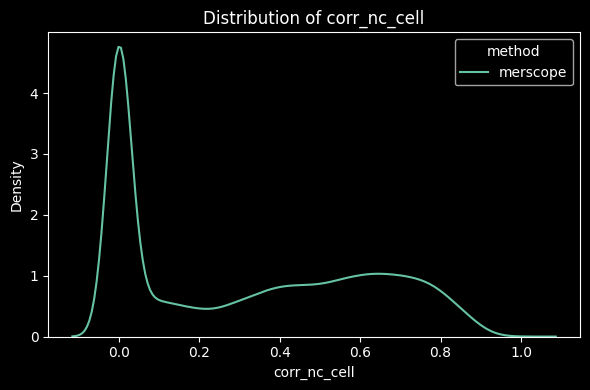

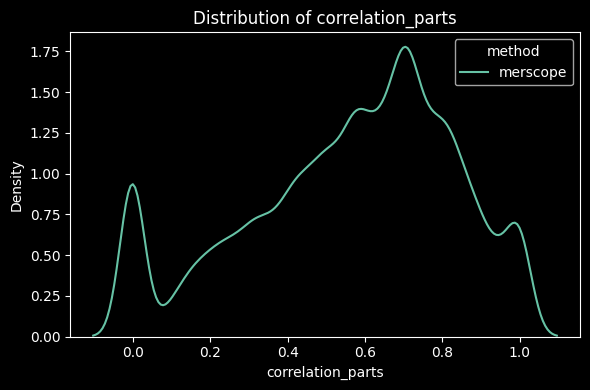

In [14]:
features = ["IoU", "corr_nc_cell", "correlation_parts"]

# Collect features into one dataframe
all_feats = []

for method, st in st_dict.items():
    feat = st.sdata["table"].obs[features]
    tmp = feat.copy()
    tmp["method"] = method
    all_feats.append(tmp)

df = pd.concat(all_feats, ignore_index=True)
df["method"] = df["method"].astype(str)

feature_cols = [c for c in df.columns if c != "method"]

# Dark style once
plt.style.use("dark_background")

for feat_name in feature_cols:
    fig, ax = plt.subplots(figsize=(6, 4), facecolor="black")
    ax.set_facecolor("black")

    sns.kdeplot(data=df, x=feat_name, hue="method", common_norm=False, palette="Set2", fill=False, ax=ax)

    ax.set_title(f"Distribution of {feat_name}", color="white")
    ax.set_xlabel(feat_name, color="white")
    ax.set_ylabel("Density", color="white")
    ax.tick_params(colors="white")

    fig.tight_layout()
    plt.show()

In [51]:
def plot_ious(sdata, boundary_key, method):
    sdata_plot = copy.deepcopy(sdata)
    sdata_plot["table"].obs.index.name = ""
    # above required when index name matches a column name,
    # because `reset_index()` is called spatialdata_plot
    sdata_plot["table"] = sdata_plot["table"][
        sdata_plot["table"].obs["IoU"].notna()
    ]  # exclude missing values for spatialdata_plot

    fig, axes = plt.subplots(3, 1, figsize=(10, 30), constrained_layout=True, facecolor="black")
    axes = axes.flatten()

    for ax in axes:
        ax.set_facecolor("black")
        ax.tick_params(colors="white")
        ax.title.set_color("white")

    sdata_plot.tables["table"].obs["region"] = boundary_key
    sdata_plot.set_table_annotates_spatialelement("table", region=boundary_key)

    sdata_plot.pl.render_shapes("nucleus_boundaries").pl.show(
        ax=axes[0], title=f"{method}: Nucleus boundaries", coordinate_systems="global"
    )

    sdata_plot.pl.render_shapes(boundary_key, color="IoU").pl.show(
        ax=axes[1], title=f"{method}: Cell boundaries colored by IoU", coordinate_systems="global"
    )

    sdata_plot.pl.render_shapes(
        element=boundary_key,
        color="IoU",
        cmap="viridis",
        fill_alpha=1,
        outline_alpha=0.5,
        outline_width=0.5,
        outline_color="white",
    ).pl.render_shapes(
        element="nucleus_boundaries",
        fill_alpha=0.1,
        outline_alpha=0.9,
        outline_width=0.5,
        outline_color="black",
    ).pl.show(ax=axes[2], title=f"{method}: Overlay of nuclei and cell masks colored by IoU", colorbar=True)

    return fig, axes

INFO     Using 'datashader' backend with 'None' as reduction method to speed up plotting. Depending on the         
         reduction method, the value range of the plot might change. Set method to 'matplotlib' to disable this    
         behaviour.                                                                                                
INFO     Using 'datashader' backend with 'None' as reduction method to speed up plotting. Depending on the         
         reduction method, the value range of the plot might change. Set method to 'matplotlib' to disable this    
         behaviour.                                                                                                
INFO     Using the datashader reduction "mean". "max" will give an output very close to the matplotlib result.     
INFO     Using 'datashader' backend with 'None' as reduction method to speed up plotting. Depending on the         
         reduction method, the value range of the plot might change. Set

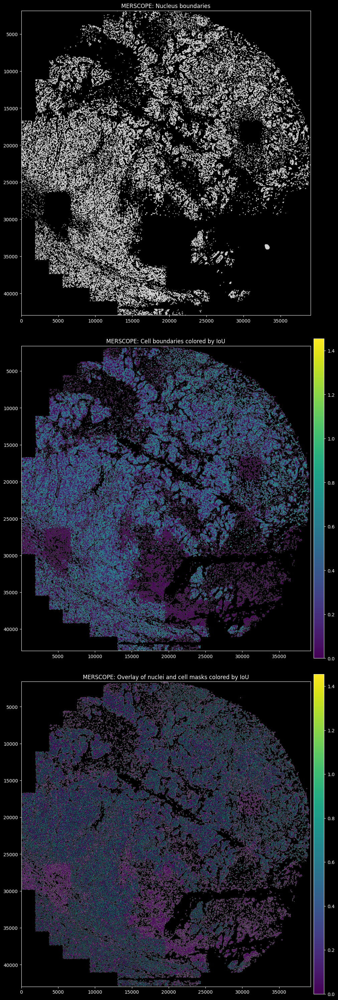

In [50]:
fig, axes = plot_ious(sdata_merscope, "Merscope_region_R1_polygons", "MERSCOPE")

#### Supervised metrics

To enable the computation of supervised metrics, we first transfer labels from the reference scRNA-seq dataset to the spatial data using `segtraq.run_label_transfer`.

In [82]:
adata_ref = ad.read_h5ad("../../data/BC_scRNAseq_Janesick.h5ad")

In [83]:
for _method, st in st_dict.items():
    st.run_label_transfer(
        adata_ref, ref_cell_type="celltype_major", inplace=True, ref_ensemble_key=None, query_ensemble_key=None
    )

/home/lazic/.local/share/uv/python/cpython-3.12.11-linux-x86_64-gnu/lib/python3.12/functools.py:912: ImplicitModificationWarning: Transforming to str index.
  return dispatch(args[0].__class__)(*args, **kw)
/home/lazic/.local/share/uv/python/cpython-3.12.11-linux-x86_64-gnu/lib/python3.12/functools.py:912: ImplicitModificationWarning: Transforming to str index.
  return dispatch(args[0].__class__)(*args, **kw)
/g/huber/users/lazic/src/SegTraQ/src/segtraq/SegTraQ.py:346: RuntimeWarning: Spatialdata table appears to contain raw counts. Counts will be log1p-transformed before running label transfer.Raw counts will be stored in `adata_q.layers["raw"]`.
  result = _run_label_transfer(
/g/huber/users/lazic/src/SegTraQ/src/segtraq/utils.py:78: ImplicitModificationWarning: Setting element `.layers['raw']` of view, initializing view as actual.
  """
/home/lazic/.local/share/uv/python/cpython-3.12.11-linux-x86_64-gnu/lib/python3.12/functools.py:912: ImplicitModificationWarning: Transforming to s

In [86]:
# Define color palette for plotting

col_celltype = {
    "T": "#fb8072",
    "B": "#bc80bd",
    "macro": "#910290",
    "dendritic": "#fdb462",
    "mast": "#959059",
    "perivas": "#fed9a6",
    "endo": "#a6cee3",
    "myoepi": "#2782bb",
    "DCIS1": "#3c7761",
    "DCIS2": "#66a61e",
    "tumor": "#66c2a5",
    "stromal": "#d45943",
    "Unknown": "#808080",
}

In [88]:
def plot_transferred_labels(sdata, boundaries_key, method):
    # Replace NaN with Unknown for spatialdata_plot
    s = sdata.tables["table"].obs["transferred_cell_type"]
    if pd.api.types.is_categorical_dtype(s):
        s = s.cat.add_categories(["Unknown"])

    sdata.tables["table"].obs["transferred_celltype_plot"] = s.fillna("Unknown")
    labels = sdata.tables["table"].obs["transferred_celltype_plot"].unique().astype(str).tolist()
    cols = [col_celltype[lab] for lab in labels]

    fig, axes = plt.subplots(2, 1, figsize=(15, 15), constrained_layout=True, facecolor="black")
    axes = axes.flatten()
    for ax in axes:
        ax.set_facecolor("black")
        ax.tick_params(colors="white")
        ax.title.set_color("white")

    sdata_merscope.pl.render_images("Merscope_region_R1_z3", channel="DAPI", scale="scale4").pl.show(
        ax=axes[0], title=f"{method}: DAPI image", coordinate_systems="global"
    )

    sdata.tables["table"].obs["region"] = boundaries_key
    sdata.set_table_annotates_spatialelement("table", region=boundaries_key)

    sdata.pl.render_shapes(
        boundaries_key,
        color="transferred_celltype_plot",
        palette=cols,
        groups=labels,
        outline_color="white",
        outline_width=0.5,
    ).pl.show(
        ax=axes[1], title=f"{method}: Cell mask - boundaries colored by transferred label", coordinate_systems="global"
    )

    return fig, axes

/tmp/ipykernel_205887/545405842.py:4: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(s):


INFO     Using 'datashader' backend with 'None' as reduction method to speed up plotting. Depending on the         
         reduction method, the value range of the plot might change. Set method to 'matplotlib' to disable this    
         behaviour.                                                                                                


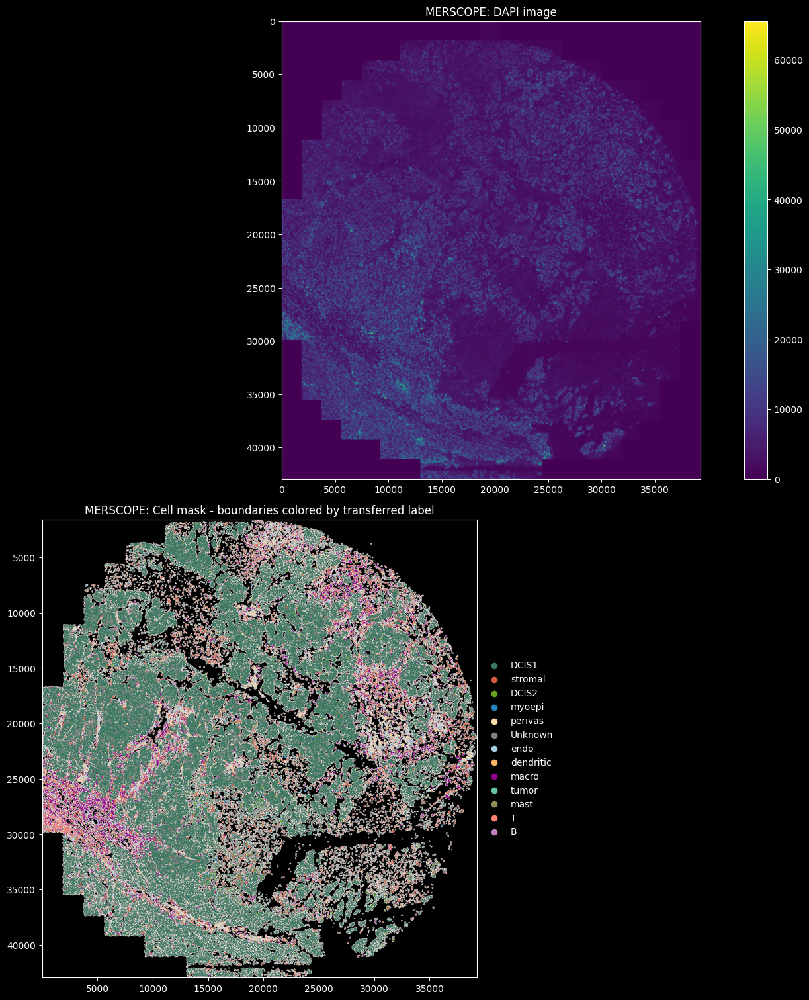

In [89]:
fig, axes = plot_transferred_labels(sdata_merscope, "Merscope_region_R1_polygons", "MERSCOPE")

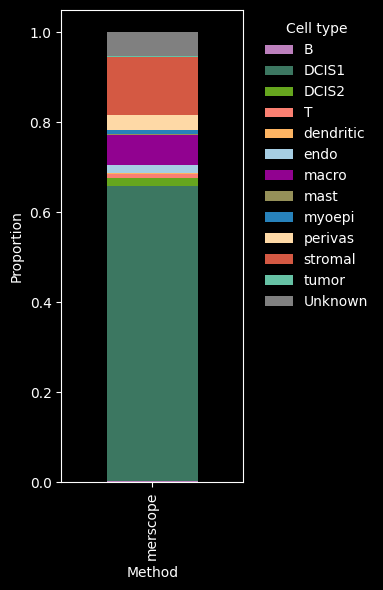

In [63]:
method_dfs = []
for method, st in st_dict.items():
    df = st.sdata["table"].obs["transferred_celltype_plot"].value_counts(normalize=True).reset_index()
    df.columns = ["celltype", "proportion"]
    df["method"] = method
    method_dfs.append(df)

plot_df = pd.concat(method_dfs, ignore_index=True)
plot_wide = plot_df.pivot(index="method", columns="celltype", values="proportion").fillna(0)

method_order = ["merscope"]
plot_wide = plot_wide.loc[method_order]

plt.style.use("dark_background")

fig, ax = plt.subplots(figsize=(4, 6), facecolor="black")
ax.set_facecolor("black")

plot_wide.plot(kind="bar", stacked=True, color=[col_celltype.get(c, "grey") for c in plot_wide.columns], ax=ax)

ax.set_ylabel("Proportion", color="white")
ax.set_xlabel("Method", color="white")
ax.tick_params(colors="white")

# Legend text in white
legend = ax.legend(title="Cell type", bbox_to_anchor=(1.05, 1), loc="upper left", frameon=False)
plt.setp(legend.get_texts(), color="white")
plt.setp(legend.get_title(), color="white")

fig.tight_layout()
plt.show()

In [85]:
def boxplot_per_celltype(st_dict, feature, q=1):
    dfs = []
    for method, st in st_dict.items():
        obs = st.sdata["table"].obs
        tmp = obs[["transferred_celltype_plot", feature]].copy()
        tmp["method"] = method
        dfs.append(tmp)

    df = pd.concat(dfs, ignore_index=True)
    df = df[(df[feature] <= df[feature].quantile(q))]

    fig, ax = plt.subplots(figsize=(15, 5), facecolor="black")
    ax.set_facecolor("black")

    sns.boxplot(
        data=df,
        x="transferred_celltype_plot",
        y=feature,
        hue="method",
        showcaps=True,
        showfliers=False,
        palette="Set2",
        ax=ax,
    )

    handles, labels = ax.get_legend_handles_labels()
    n_methods = df["method"].nunique()
    legend = ax.legend(
        handles[:n_methods],
        labels[:n_methods],
        title="Method",
        bbox_to_anchor=(1.05, 1),
        loc="upper left",
        frameon=False,
    )

    plt.setp(legend.get_texts(), color="white")
    plt.setp(legend.get_title(), color="white")

    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right", color="white")
    ax.set_xlabel("Cell type", color="white")
    ax.set_ylabel(feature, color="white")
    ax.tick_params(colors="white")

    fig.tight_layout()
    plt.show()

/tmp/ipykernel_205887/543047876.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right", color="white")


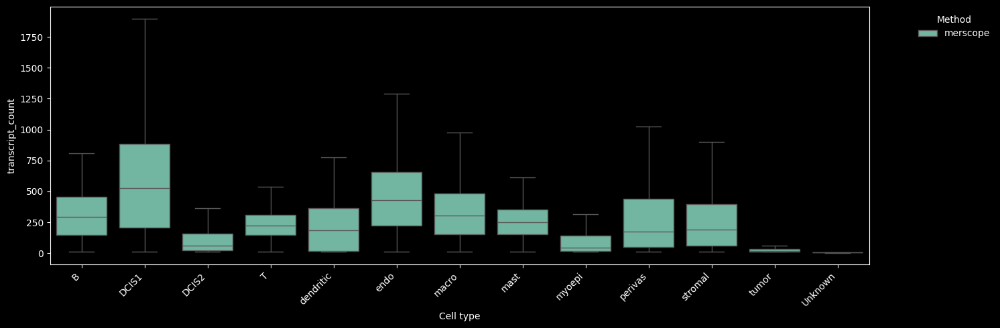

In [72]:
boxplot_per_celltype(st_dict, "transcript_count")

The supervised metrics module (`sp`) provides metrics to compare the spatial single cell expression profiles to those from a single-cell RNA sequencing dataset.

In [84]:
for _method, st in st_dict.items():
    tbl = st.sdata["table"]
    common_genes = tbl.var_names[tbl.var_names.isin(adata_ref.var_names)]
    adata_ref = adata_ref[:, common_genes].copy()

    markers = segtraq.get_ref_markers(adata_ref, ref_cell_type="celltype_major", q_pos=0.95, q_neg=0.1, t=0.25)

    st.sp.calculate_marker_purity(cell_type_key="transferred_cell_type", markers=markers)

/home/lazic/.local/share/uv/python/cpython-3.12.11-linux-x86_64-gnu/lib/python3.12/functools.py:912: ImplicitModificationWarning: Transforming to str index.
  return dispatch(args[0].__class__)(*args, **kw)


/tmp/ipykernel_205887/543047876.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right", color="white")


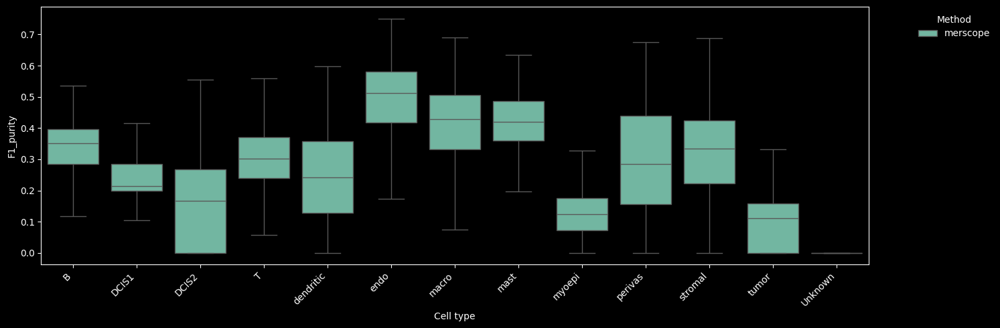

In [90]:
boxplot_per_celltype(st_dict, "F1_purity")

/tmp/ipykernel_205887/543047876.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right", color="white")


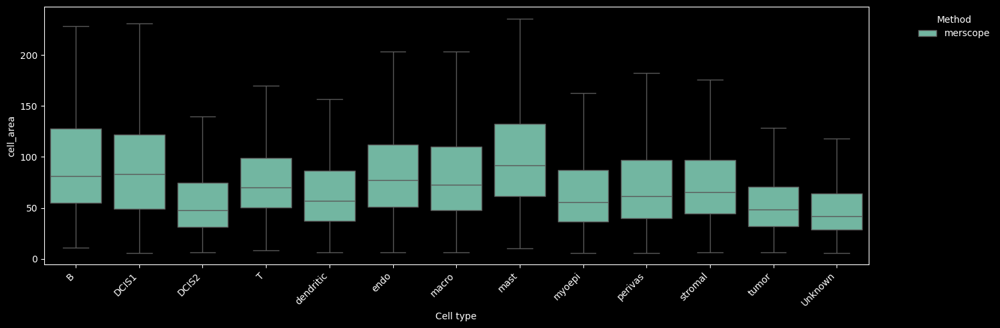

In [91]:
boxplot_per_celltype(st_dict, "cell_area", q=0.99)